In [1]:
import warnings
import numpy as np
import scipy as sp
# %matplotlib inline
import matplotlib
# %matplotlib widget
import matplotlib.pyplot as plt
import tanglepack
import tanglepack.InitialManifold
%load_ext autoreload
%autoreload 2

/mnt/c/Users/etccu/Documents/TanglePack/env/lib/python3.12/site-packages/numpy/_core/getlimits.py:551: UserWarning: Signature b'\x00\xd0\xcc\xcc\xcc\xcc\xcc\xcc\xfb\xbf\x00\x00\x00\x00\x00\x00' for <class 'numpy.longdouble'> does not match any known type: falling back to type probe function.
This warnings indicates broken support for the dtype!
  machar = _get_machar(dtype)


In [3]:
def henon(point):
    """defines the henon map for classical parameters to test basic functionality"""

    k, b = (10, 1)

    x = point[0]
    y = point[1]

    return np.array([y - k + x ** 2, -b * x])


def henon_inverse(point):
    """defines the inverse henon map for classical parameters"""

    k, b = (10, 1)

    x = point[0]
    y = point[1]

    return np.array([-y / b, x + k - (y ** 2) / (b ** 2)])


def henon_jacobian(point):
    """defines the jacobian for the henon map"""

    k, b = (10, 1)

    x = point[0]
    y = point[1]

    return np.array([[2*x, 1], [-b, 0]])

In [ ]:
# import tanglepack.FixedPoint2

guess = np.array([5, 0])

point = tanglepack.FixedPoint2(henon, guess, dynamical_map_inverse=henon_inverse, jacobian_function=henon_jacobian)

print('bob')
# print(f'{point.jacobian}')

# manifold = tanglepack.InitialManifold(point)
manifold = tanglepack.Manifold2(point, point.points[0], 'unstable')
print(type(point.points[0]))
print(manifold.root_node.get_point())

print('bob2')

# print(manifold.points.points)

points1 = np.array(manifold.point_list)

manifold.iterate_manifold()
manifold.iterate_manifold()

# print(f"points: {manifold.points.points}")

points2 = np.array(manifold.point_list)

manifold.iterate_manifold()
# manifold.iterate_manifold()|

for i in range(2):
    manifold.iterate_manifold()

points3 = np.array(manifold.point_list)

This is the fixed point [[ 4.31662478 -4.31662478]]
wow fixed point: [[ 4.31662478 -4.31662478]]
Fixed Point Accurarcy: 0.0033886167370906404
entered eigenvalues
bob
<class 'tanglepack.MultiPoint.MultiPoint'>


AttributeError: 'NoneType' object has no attribute 'get_point'

In [74]:
print(point.fixed_point[:,0])
print(point.stretch_params)

[4.31662478]


AttributeError: 'FixedPoint2' object has no attribute 'stretch_params'

In [4]:
manifold_A = np.array(manifold.point_list)

matrix = np.array([[0, 1], [-1, 0]])

manifold_B = np.array([matrix @ point for point in manifold_A])

In [5]:
print(manifold_A)

[[[ 4.31662478]
  [-4.31662478]]

 [[ 4.31622958]
  [-4.31657849]]]


In [ ]:
matplotlib.use('TkAgg')  # or 'Qt5Agg'

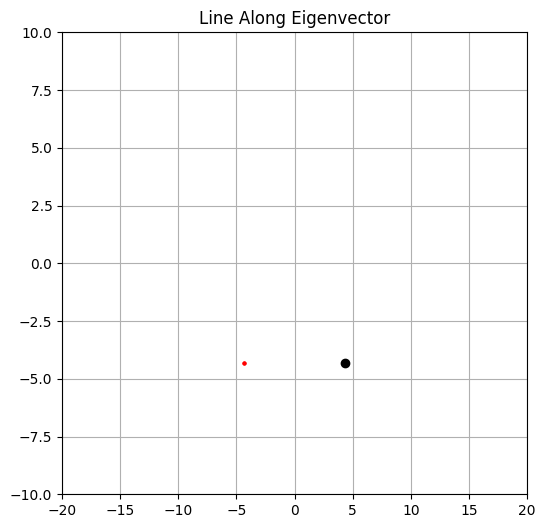

In [6]:

plt.figure(figsize=(6,6))

plt.scatter(point.fixed_point[0][0], point.fixed_point[0][1], color='black', zorder=3, label="Fixed Point")  # Mark the start point

plt.plot(manifold_A[:, 0], manifold_A[:, 1], c='b', marker='o', markersize=2, linewidth=.1,antialiased=False)
plt.plot(manifold_B[:, 0], manifold_B[:, 1], c='r', marker='o', markersize=2, linewidth=.1,antialiased=False)


plt.grid()
# plt.legend()
plt.title("Line Along Eigenvector")

plt.xlim([-20, 20])
plt.ylim([-10, 10])

# plt.xlim([4.15, 4.20])
# plt.ylim([-4.3, -4.295])

plt.show()

In [ ]:
from rtree import index
from shapely.geometry import LineString

idx = index.Index()

# Build R-tree from A
for i in range(len(manifold_A) - 1):
    segment = LineString([manifold_A[i], manifold_A[i+1]])
    idx.insert(i, segment.bounds, obj=segment)

# Check each segment of B
counter = 0
for j in range(len(manifold_B) - 1):
    new_segment = LineString([manifold_B[j], manifold_B[j+1]])
    for candidate in idx.intersection(new_segment.bounds, objects=True):
        if new_segment.intersects(candidate.object):
            # print("Intersection found!", new_segment, candidate.object)
            counter += 1


Intersection found! LINESTRING (-4.2879761439659845 -4.073480118856896, -4.073480118856896 -2.3052641347564062) LINESTRING (-4.575245619705026 -3.0907627057556137, -1.9452305726086028 -3.499383398639004)
Intersection found! LINESTRING (-4.2879761439659845 -4.073480118856896, -4.073480118856896 -2.3052641347564062) LINESTRING (-4.677529188316603 -3.079912796859338, -2.019357198951674 -3.492150113072641)
Intersection found! LINESTRING (-4.2879761439659845 -4.073480118856896, -4.073480118856896 -2.3052641347564062) LINESTRING (-3.3304381052276355 -3.296151198876828, -4.882996251489507 -3.0465820030877726)
Intersection found! LINESTRING (-4.2879761439659845 -4.073480118856896, -4.073480118856896 -2.3052641347564062) LINESTRING (-3.3304381052276355 -3.296151198876828, -4.882996251489507 -3.0465820030877726)
Intersection found! LINESTRING (-4.2879761439659845 -4.073480118856896, -4.073480118856896 -2.3052641347564062) LINESTRING (-3.3304381052276355 -3.296151198876828, -4.882996251489507 -3.

In [22]:
print(counter)

62078


In [33]:
from shapely.geometry import LineString
from rtree import index

def build_segments(points):
    return [LineString([points[i], points[i+1]]) for i in range(len(points) - 1)]

def segments_actually_cross(seg1, seg2):
    inter = seg1.intersection(seg2)
    return inter.geom_type == 'Point'  # Only count proper crossings

def find_intersections(manifold_A, manifold_B):
    segments_A = build_segments(manifold_A)
    segments_B = build_segments(manifold_B)

    idx = index.Index()
    for i, seg in enumerate(segments_A):
        idx.insert(i, seg.bounds, obj=seg)

    intersections = []
    for seg_B in segments_B:
        for candidate in idx.intersection(seg_B.bounds, objects=True):
            seg_A = candidate.object
            if segments_actually_cross(seg_A, seg_B):
                intersections.append((seg_A, seg_B))

    return intersections


In [34]:
intersections = find_intersections(manifold_A, manifold_B)
print(f"Found {len(intersections)} intersections")

Found 62078 intersections


In [31]:
from rtree import index

def orientation(a, b, c, eps=1e-15):
    """
    Returns:
      0 if a, b, c are collinear
      1 if clockwise
      2 if counterclockwise
    """
    val = (b[1] - a[1])*(c[0] - b[0]) - (b[0] - a[0])*(c[1] - b[1])
    if abs(val) < eps:
        return 0
    return 1 if val > 0 else 2

def do_segments_intersect(segA, segB):
    """
    Using orientation tests to see if segA and segB intersect in a proper point.
    segA, segB = ((x1,y1), (x2,y2)), ((x3,y3), (x4,y4))
    Returns True if there's a proper intersection, False otherwise.
    Ignores collinearity for simplicity (treat collinear as not intersecting).
    """
    (p1, p2) = segA
    (p3, p4) = segB

    o1 = orientation(p1, p2, p3)
    o2 = orientation(p1, p2, p4)
    o3 = orientation(p3, p4, p1)
    o4 = orientation(p3, p4, p2)

    # General case:
    if o1 != o2 and o3 != o4:
        return True

    return False  # no intersection if collinear or not straddling

def build_segments(points):
    """
    Convert [p0, p1, p2, ...] to list of segments [ (p0,p1), (p1,p2), ... ].
    """
    return [(points[i], points[i+1]) for i in range(len(points)-1)]

def segment_bbox(seg):
    """ Return (minx, miny, maxx, maxy). """
    (x1,y1),(x2,y2) = seg
    return (min(x1,x2), min(y1,y2),
            max(x1,x2), max(y1,y2))

def find_intersections(manifoldA_points, manifoldB_points, debug=False):
    """
    R-tree approach:
      1) Insert segments from A in the tree
      2) For each seg in B, query bounding box overlap
      3) Use orientation-based test for final intersection check
    Return a list of (iA, iB) indices indicating which segments intersect.
    """
    segA = build_segments(manifoldA_points)
    segB = build_segments(manifoldB_points)

    # Build R-tree
    idxA = index.Index()
    for i, sA in enumerate(segA):
        idxA.insert(i, segment_bbox(sA))

    results = []
    for j, sB in enumerate(segB):
        candidates = list(idxA.intersection(segment_bbox(sB)))
        for i in candidates:
            if do_segments_intersect(segA[i], sB):
                # Record pair
                results.append((i, j))
                if debug:
                    print(f"DEBUG: A[{i}] = {segA[i]} intersects B[{j}] = {sB}")

    return results


In [33]:
hits = find_intersections(manifold_A, manifold_B, debug=True)
print("Number of segment intersections found:", len(hits))
# Expect 1 intersection if each is just 1 segment

DEBUG: A[277] = (array([-4.57524562, -3.09076271]), array([-1.94523057, -3.4993834 ])) intersects B[22] = (array([-4.28797614, -4.07348012]), array([-4.07348012, -2.30526413]))
DEBUG: A[61] = (array([-4.80396995, -3.05952438]), array([-3.23269924, -3.31094446])) intersects B[22] = (array([-4.28797614, -4.07348012]), array([-4.07348012, -2.30526413]))
DEBUG: A[101] = (array([-4.80397004, -3.05952436]), array([-3.23269937, -3.31094444])) intersects B[22] = (array([-4.28797614, -4.07348012]), array([-4.07348012, -2.30526413]))
DEBUG: A[315] = (array([-4.80397004, -3.05952436]), array([-3.23269937, -3.31094444])) intersects B[22] = (array([-4.28797614, -4.07348012]), array([-4.07348012, -2.30526413]))
DEBUG: A[129] = (array([-4.80397079, -3.05952424]), array([-3.23270046, -3.31094427])) intersects B[22] = (array([-4.28797614, -4.07348012]), array([-4.07348012, -2.30526413]))
DEBUG: A[343] = (array([-4.80397079, -3.05952424]), array([-3.23270046, -3.31094427])) intersects B[22] = (array([-4

In [34]:
# This obviously crosses at (2.5, 2.5)
results = find_intersections(manifold_A, manifold_B)

print("Intersections found:", len(results))
for ipoint, idxA, idxB in results:
    print(f"Segments A[{idxA}] and B[{idxB}] intersect at {ipoint}")

Intersections found: 6034


ValueError: not enough values to unpack (expected 3, got 2)

In [36]:
import matplotlib.pyplot as plt

def plot_points(points, color='blue'):
    xs = [p[0] for p in points]
    ys = [p[1] for p in points]
    plt.plot(xs, ys, marker='o', linestyle='-')  # line + dots

plt.figure()
plot_points(manifold_A, color='red')
plot_points(manifold_B, color='blue')
plt.title("Check the order of manifold points!")
plt.show()


In [37]:
print(len(results))

62078


In [37]:
def count_unique_intersection_points(results, tol=1e-9):
    """
    results is a list of tuples like [((ix, iy), idxA, idxB), ...].
    We want to count unique (ix, iy) points within a tolerance.
    """
    unique_points = []  # we'll store (ix, iy) here

    for ((ix, iy), segA_idx, segB_idx) in results:
        found_close = False
        for (px, py) in unique_points:
            # If the new point is within 'tol' of an existing one, count it as duplicate
            if abs(ix - px) < tol and abs(iy - py) < tol:
                found_close = True
                break
        if not found_close:
            unique_points.append((ix, iy))

    return len(unique_points)

# Example of usage after you get 'results' from find_intersections()
unique_count = count_unique_intersection_points(results)
print("Unique intersection points:", unique_count)


ValueError: not enough values to unpack (expected 3, got 2)